# IncrVAE

This repository contains the code for the following IEEE RA-L article:

Azzalini, Davide, Luca Bonali, and Francesco Amigoni. "A Minimally Supervised Approach Based on Variational Autoencoders for Anomaly Detection in Autonomous Robots." IEEE Robotics and Automation Letters 6.2 (2021): 2985-2992.

## Imports

In [1]:
import random as r
from math import degrees
from math import sqrt
from math import cos
from math import sin
from math import radians
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import glob
import os
import re
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from mpl_toolkits.mplot3d import Axes3D
from model_script import Vae_cnn_BILSTM
from sklearn.decomposition import PCA
import datetime
import time
from scipy import interpolate
import tensorflow as tf
from scipy import signal

Using TensorFlow backend.


## Global Variables

In [2]:
path = './Data_gen_boat/run^'    # path to the folder containing the training set
latent_dim = 10                  # latent space dimension
n_features = 6                   # numebr of sensors in the input runs
n_runs = 1000                    # number of runs in the training set

## Interpolation and Padding

The following snippet of code takes as input a batch of runs of different lenghts and interpolates and padds them to same length.

In [3]:
def prepare_training(path, n_runs):
    labels = []

    def closest_4(n, m):
        q = n / m
        n1 = m * q
        if (n * m) > 0:
            n2 = m * (q + 1)
        else:
            n2 = m * (q - 1)
        if abs(n - n1) < abs(n - n2):
            return int(n1)
        return int(n2)

    def extend_line(run, max_len):
        difference = abs(len(run) - max_len)
        extension = np.array([[0,0,0,0,0,0]] * difference)

        if difference != 0:
            run = np.vstack([run, extension])
        return run

    def get_max_len(sequence_list):
        max_len = 0
        min_len = 1000
        for seq in sequence_list:
            if len(seq) > max_len:
                max_len = len(seq)
            if len(seq) < min_len:
                min_len = len(seq)
        return max_len, min_len

    def construct_matrix(sequence_list):
        max_len, min_len = get_max_len(sequence_list)
        len_m = closest_4(max_len, 4)
        len_m = 440
        train_matrix = np.zeros(shape=(n_runs, len_m, n_features))
        for index, run in enumerate(sequence_list):
            line = extend_line(run, len_m)
            train_matrix[index] = line
        return train_matrix

    def stadard_sequences(seqs):
        for i, seq in enumerate(seqs):
            seqs[i] = StandardScaler().fit_transform(seq)
        return seqs

    def shift_timing_to_0(times):
        interval = np.max(times) - np.min(times)
        times_new = np.linspace(0,interval, len(times))
        return times_new
    
    def resample_run(run_cutted, run_index):
        n_points = 440
        
        df_new = pd.DataFrame([], columns=run_cutted.columns)
        
        for col in run_cutted.columns:     
            tck,u=interpolate.splprep([np.linspace(0,1,len(run_cutted)),run_cutted[col]],s=0.0)
            x_i, y_i= interpolate.splev(np.linspace(0,1,n_points),tck)
            f = signal.resample(run_cutted[col], n_points)
            df_new[col] = f

        return df_new 

    
    def resample_df(df_list):
        runs = []
        mins_maxs = []
        for i,run in enumerate(df_list):
            run_resampled = np.array(resample_run(run, i))
            runs.append(run_resampled)
        return np.array(runs)
    
    
    def order_runs_by_len(runs):
        runs.sort(key=len)
        for r in runs:
            labels.append(r['Choice'][0])
        for i, r in enumerate(runs):
            runs[i] = runs[i].drop(columns=['Choice'])
        return runs, labels

    def read_sequences():
        run_list_mix = []
        for index in range(n_runs):
            run_csv = pd.read_csv(path + str(index))
            run_csv = run_csv.drop(columns=['Unnamed: 0'])
            run_list_mix.append(run_csv)
        run_list_ordered, labels = order_runs_by_len(run_list_mix)
        
        df_list_resampled = resample_df(run_list_ordered)
        stands = stadard_sequences(df_list_resampled)
        padded_matrix = construct_matrix(stands)
        return stands, labels

    return read_sequences()


train_matrix, labels = prepare_training(path, n_runs)
train_matrix = np.array(train_matrix)
labels = np.array(labels)

print(len(train_matrix), labels.shape)

1000 (1000,)


## Prepare Incremental Training Set

In [4]:
 def extend_line(run, max_len):
    difference = abs(len(run) - max_len)
    extension = np.array([[0,0,0,0,0,0]] * difference)
    if difference != 0:
        run = np.vstack([run, extension])
    return run  


def prepare_online_matrix():
    len_mat_online = int(train_matrix.shape[0]*(n_repetitions))
    mat_online = np.zeros(shape=(len_mat_online, train_matrix.shape[1], train_matrix.shape[2]))
    print(mat_online.shape)
    
    for index in range(n_repetitions):
        runs_to_extend = train_matrix[:,:(index+1)*time_segment_len]
        zero_mat_rep = np.zeros(shape=train_matrix.shape)
        for i, line in enumerate(runs_to_extend):
                line = extend_line(line, train_matrix.shape[1])
                zero_mat_rep[i] = line
        mat_online[len(train_matrix)*index:len(train_matrix)*(index+1)] = zero_mat_rep
    return mat_online
    
    
time_segment_len = 10
n_repetitions = int(train_matrix.shape[1]/time_segment_len)  

train_matrix_online = prepare_online_matrix()
labels_online = np.array(np.ravel([labels for i in range(n_repetitions)]))
train_matrix = train_matrix_online
labels = labels_online

print(train_matrix.shape, labels.shape)

(44000, 440, 6)
(44000, 440, 6) (44000,)


## Model Creation

In [5]:
n_level_convs = [1]
filters = [10]
window_convs = [10]
latent_dim = [10]
betas = [1]
vaes_class = []
# kl_start = [10]
# kl_anneal_time = [10]
# kl_anneal = False

for lev in n_level_convs:
    for f in filters:
        for win in window_convs:
            for beta in betas:
                for lat in latent_dim:
#                 for kl_s in kl_start:
    #                     for kl_ann in kl_anneal_time:
                    vaes_class.append(Vae_cnn_BILSTM(n_features=n_features, latent_dim=lat,
                                     n_level_conv=lev, filters=f, window_conv=win, beta=beta))
                    vaes_class[-1].set_train_matrix(train_matrix, labels)                

                
for i,vae in enumerate(vaes_class):
    vae.create_model(summary=True)
    print('Model Created ', i)

(44000, 440, 6)
Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Encoder_input (InputLayer)      (None, 440, 6)       0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 440, 10)      610         Encoder_input[0][0]              
__________________________________________________________________________________________________
max_pooling1d_1 (MaxPooling1D)  (None, 220, 10)      0           conv1d_1[0][0]                   
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 20)           1680        max_pooling1d_1[0][0]            
____________________________________________________________________________

## Training

In [ ]:
for i,vae in enumerate(vaes_class): 
    print('Training Model n ', i)
    vae.train_model(n_epochs=10, verbose=True)
    print('\n\n\n\n\n')

## Saving and Loading Weights

In [ ]:
vaes_class[0].model.save_weights('weights_boat_5_1.h5')

In [6]:
vaes_class[0].model.load_weights('./weights_boat.h5')

## Latent Space Visualization

(44000, 10) (44000, 10) (44000, 10)
Component 1 shape (44000, 3)
PCA variance ratio [0.61385113 0.20778409 0.08648981]


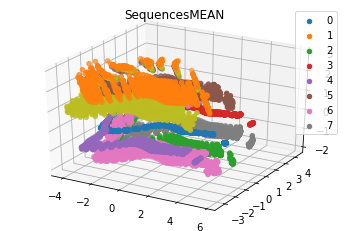

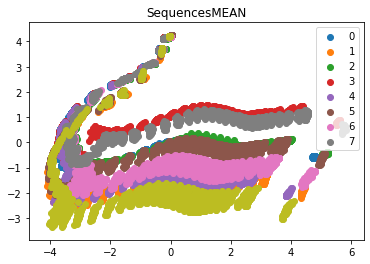

Component 1 shape (44000, 3)
PCA variance ratio [0.73581105 0.14463493 0.10484274]


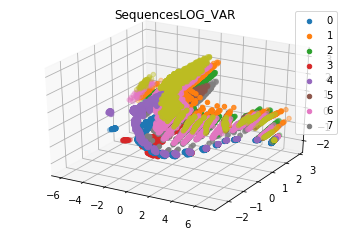

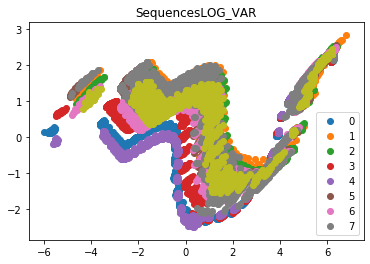

Component 1 shape (44000, 3)
PCA variance ratio [0.5957172 0.212269  0.0853204]


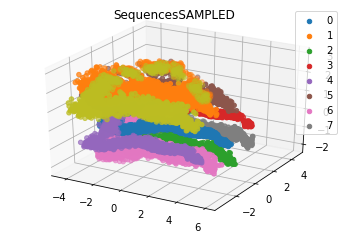

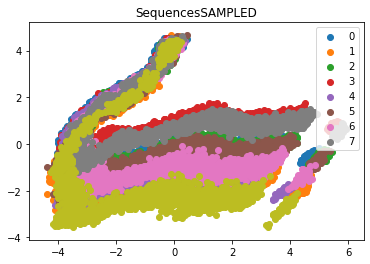

44000


In [7]:
p_comps = []
for vae in vaes_class:
    p_comps.append(vae.plot_encodings(return_mean=True))
    print(vae.n_runs)

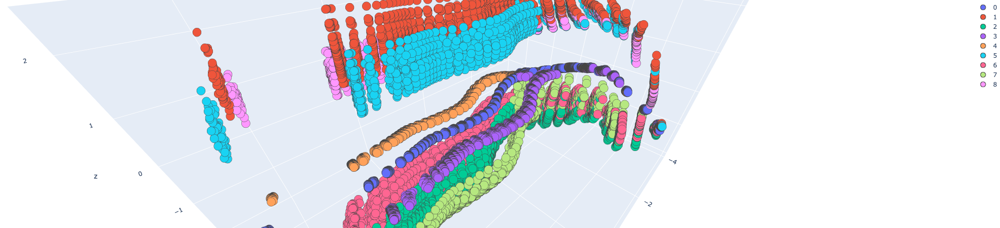

In [8]:
from ast import literal_eval
import plotly.graph_objs as go
import plotly.offline as py

def get_list_of_ids(number, labs):
    mask = np.squeeze(np.argwhere(labs == number))
    try:
        for index,pos in enumerate(mask):
            mask[index] = str(pos)
        return mask
    except:
        return mask

def plot_3d(p_comp, labs):
    colors = ['rgb(0,31,63)', 'rgb(255,133,27)', 'rgb(255,65,54)', 'rgb(0,116,217)', 'rgb(133,20,75)', 'rgb(57,204,204)',
    'rgb(240,18,190)', 'rgb(46,204,64)', 'rgb(1,255,112)', 'rgb(255,220,0)',
    'rgb(76,114,176)', 'rgb(85,168,104)', 'rgb(129,114,178)', 'rgb(100,181,205)','rgb(0,31,63)', 'rgb(255,133,27)', 'rgb(255,65,54)', 'rgb(0,116,217)', 'rgb(133,20,75)', 'rgb(57,204,204)',
    'rgb(240,18,190)', 'rgb(46,204,64)', 'rgb(1,255,112)', 'rgb(255,220,0)',
    'rgb(76,114,176)', 'rgb(85,168,104)', 'rgb(129,114,178)', 'rgb(100,181,205)']*2000
    data_graph = []
    for _, no in enumerate(np.unique(labs)):
        #print("NO=",no)
        graph = go.Scatter3d(
        x = p_comp[labs == no, 0],
        y = p_comp[labs == no, 1],
        z = p_comp[labs == no, 2],
        name = str(np.unique(labs)[no]),
        mode = 'markers',
        text = get_list_of_ids(no, labs),
        marker = dict(
            size = 10,
            line = dict(
                width = 1
                ),
            opacity = 1
            )
        )
        data_graph.append(graph)

    layout = go.Layout(
        scene = dict(
            camera = dict(
                eye = dict(
                x = 0.5,
                y = 0.5,
                z = 0.5
                )
            )
        ),
        margin = dict(
            l = 0,
            r = 0,
            b = 0,
            t = 0
        )
    )
    fig = go.Figure(data = data_graph, layout = layout)
    py.iplot(fig, filename = '3d-scatter')
    
    
for p_comp in p_comps:
    plot_3d(p_comp, labels)